# Plotting the radiation transform

Here we examine the plots of the radiation transforms of a function f(x):

$$\begin{align}
F_{\mathcal{A}}(Z) & = \int_{-\infty}^\infty f(x) u_{\mathcal{A}}(x,Z) \, dx \\[.1cm]
F_{\mathcal{B}}(Z) & = \int_{-\infty}^\infty f(x) u_{\mathcal{B}}(x,Z) \, dx.
\end{align}$$

The subscripts $\mathcal{A}, \mathcal{B}$ distinguish between radiation mode classes (even or odd for symmetric structures).

In this notebook we let f(x) be the delta function at source point $s$: $f_{s}(x) = \delta(x - s)$.


In [27]:
import numpy as np
import matplotlib.pyplot as plt
from slab import SlabExact, plot_complex, plot_complex_surface
from scipy.optimize import newton
plt.style.use('dark_background')
%matplotlib widget

## Basic 3 layer guide

Make slab object

In [2]:
A = SlabExact(symmetric=True)

In [3]:
A.delta_transform?

Signature: A.delta_transform(C, s=0, field_type='TE', sign='+1', Normalizer=None)
Docstring: Evaluate radiation transform of delta function delta(x-s).
File:      ~/local/slab/slab.py
Type:      method

## Plots of delta transform

In [34]:
ft = 'TE'
s = 0.1
Normalizer = A.normalizer('ours')

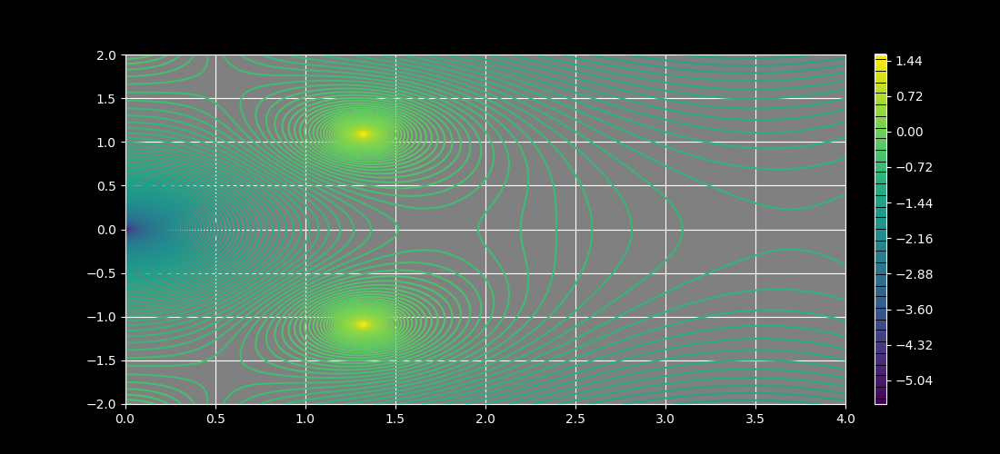

In [64]:
plot_complex(A.delta_transform, 0, 4, -2, 2, fargs=(s, ft, 1, Normalizer),
             iref=200, rref=200, levels=200,
            );

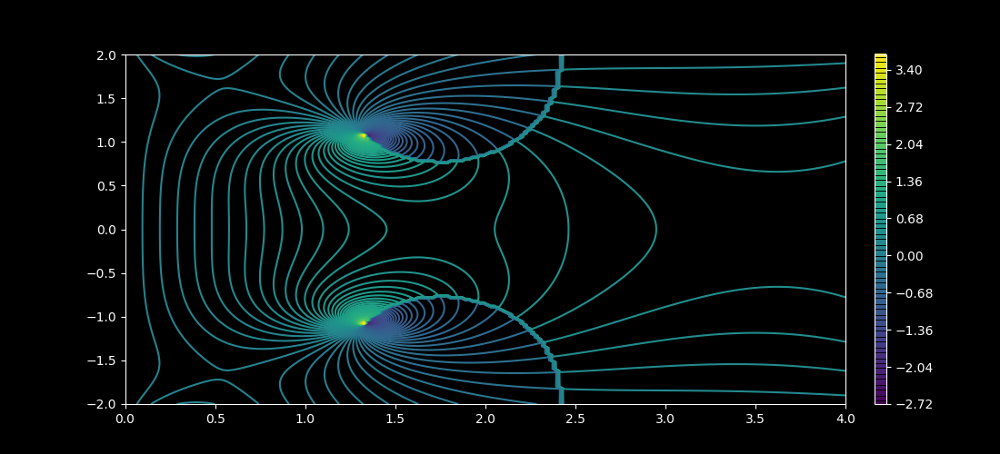

In [78]:
plot_complex(A.delta_transform, 0, 4, -2, 2, fargs=(s, ft, 1, Normalizer),
             iref=200, rref=200, levels=200, facecolor='k', grid=False,
             log_abs=False, part='real',
            );

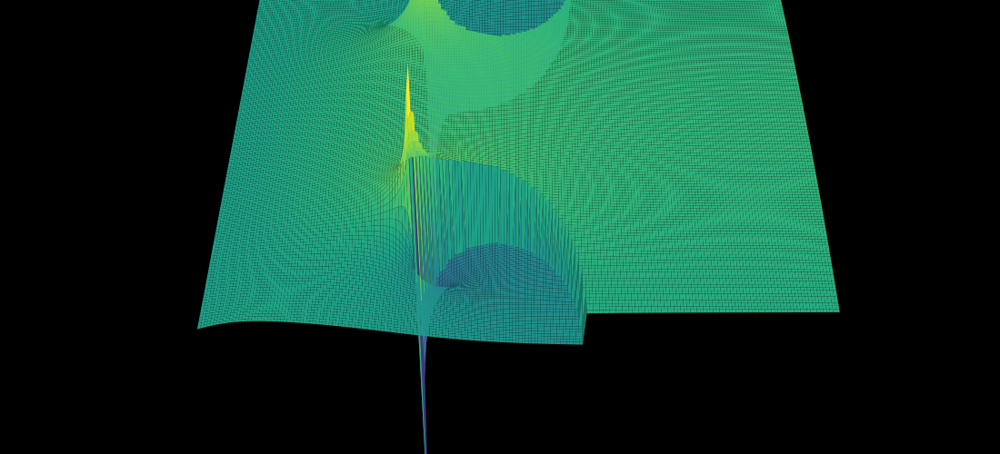

In [80]:
plot_complex_surface(A.delta_transform, 0, 4, -2, 2, fargs=(s, ft, 1, Normalizer),
                     iref=150, rref=200, log_abs=False, part='real',
                     zoom=3, cstride=1, rstride=1, colorbar=False,
                     elev=40,
                     # max_value=2, min_value=-2,
                    );

Zoom in to see if lower region contains poles or zeros.

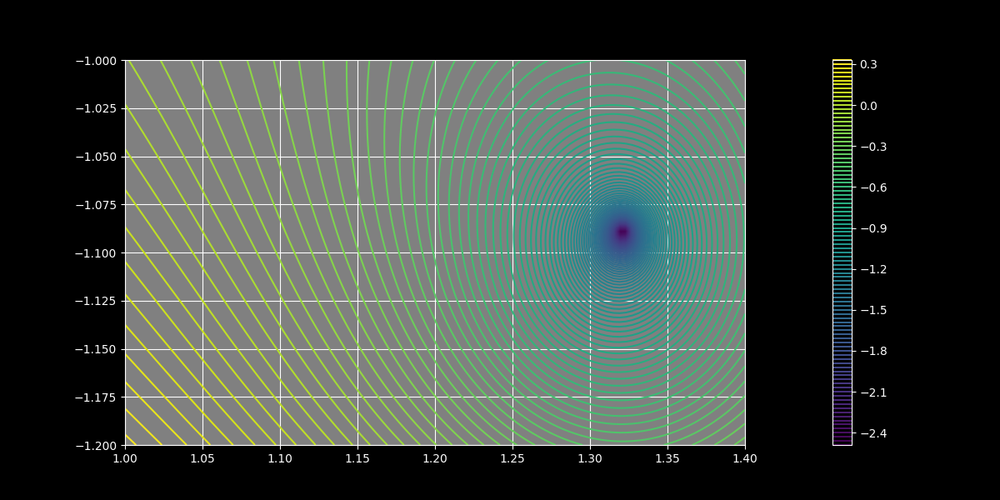

In [18]:
plotlogf(A.delta_at_s, 1, 1.4, -1, -1.2, *args_pt, iref=100, rref=100, levels=100);

Looks like zeros.  Get the pole/zero position for later use:

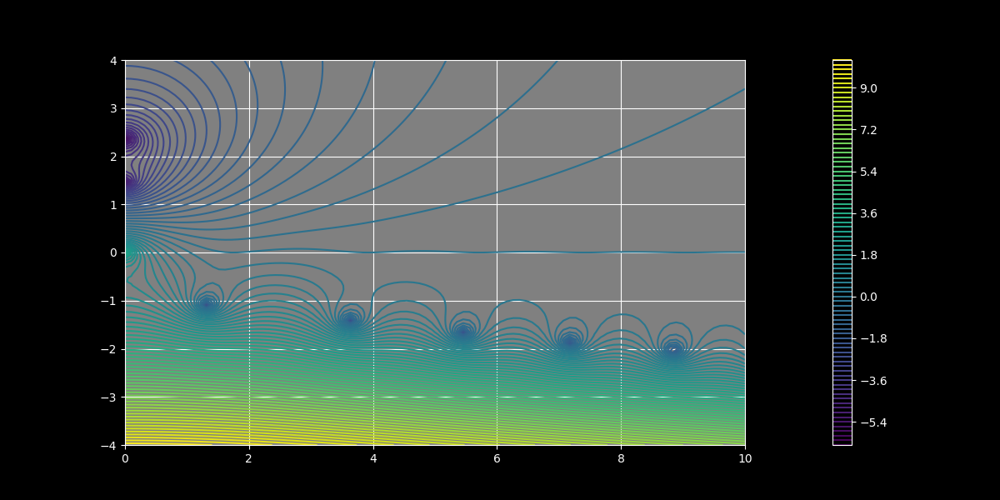

In [60]:
plotlogf(A.determinant_Z,  0, 10, -4, 4, 'TE', 'guided',  iref=100, rref=100, levels=100)

In [61]:
Z = newton(A.determinant_Z, np.array([1.7-1j]), args=('TE', 'guided'))
print(Z)
plt.plot(Z.real, Z.imag, 'ro');

[1.32142432-1.08850828j]


### Odd modes, paper method

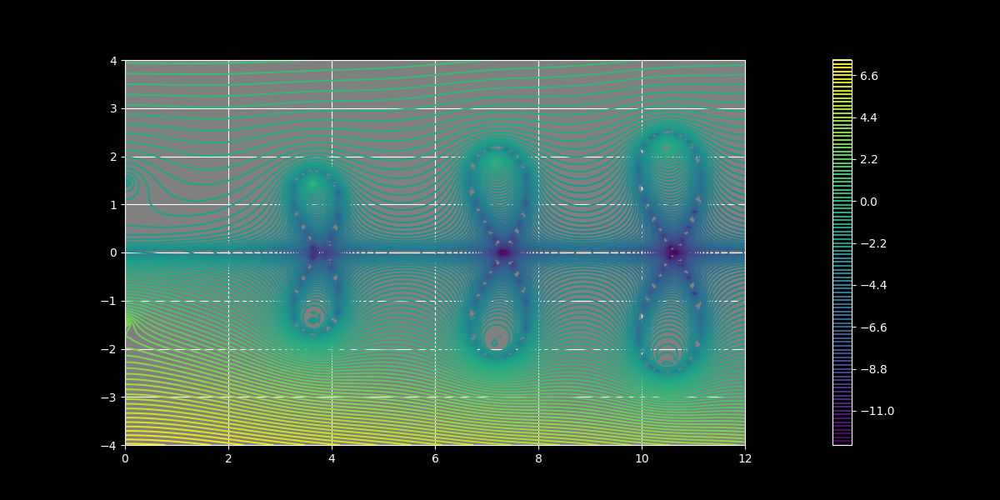

In [23]:
plotlogf(A.delta_at_s, 0, 12, -4, 4, *args_mt, iref=100, rref=100, levels=100);

## Our method of normalizing

Haven't succeeded yet in vectorizing this version of the delta transform

In [13]:
field_type = 'TE'
s = .5

args_pf = (s, field_type, '+1', False)
args_mf = (s, field_type, '-1', False)

### Even modes, our method

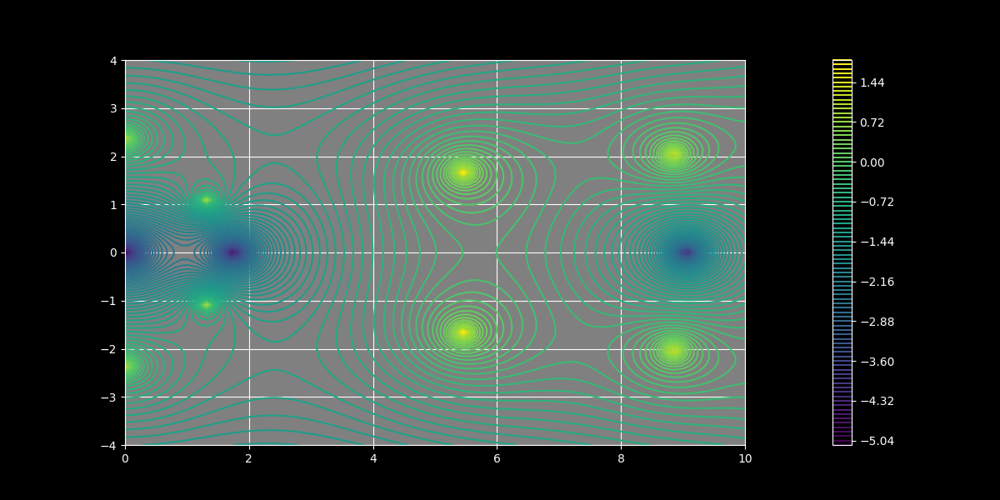

In [14]:
plotlogf(A.delta_at_s, 0, 10, -4, 4, *args_pf, iref=100, rref=100, levels=100, loop=True);

### Odd modes, our method

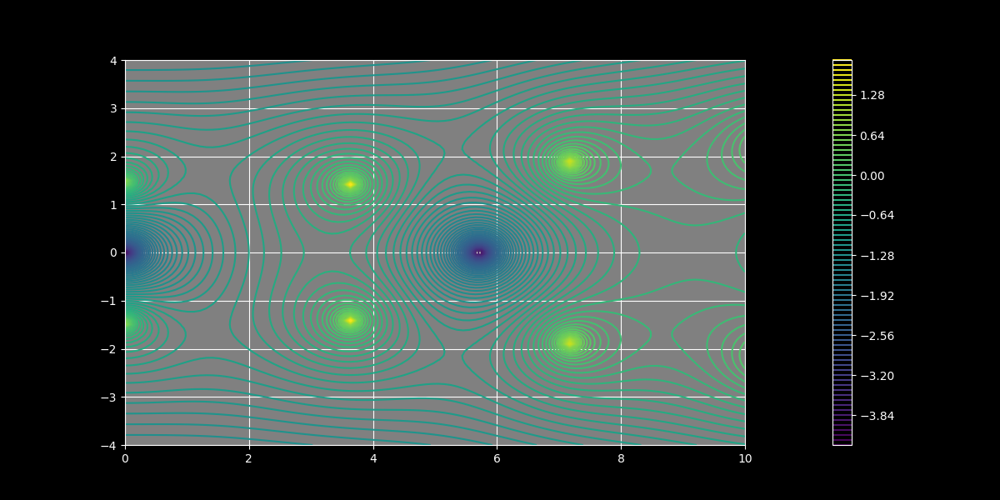

In [15]:
plotlogf(A.delta_at_s, 0, 10, -4, 4, *args_mf, iref=100, rref=100, levels=100, loop=True);

# Observations

- For our method, there are poles in both parts of the plane.  That would allow for leaky modes in the right place... 

- This connects to the fact that the delta function combines both coefficients, and as seen in the Both_Coefficients notebook, for our method the poles and zeros of the coefficients are swapped, so in total you get poles at all locations.

-  Do we see this with our method with the other input functions?  Yes, in fact that's part of why we made this notebook, to investigate that.

## Attempt to vectorize delta function

In [9]:
def delta_at_s(Z, s=0, field_type='TE', sign='+1', paper_method=False):
    j = np.argmax(s <= A.Rhos) - 1  # get index of region in which s lies (-1 since regions are 1 less than boundaries)
    Zj = A.Zi_from_Z0(Z, A.ns[j])
    Cs = A.coefficients_Z(Z, up_to_region=j, mode_type='radiation', 
                          field_type=field_type, sign=sign, paper_method=paper_method)
    return Cs[..., 0, j] * np.exp(1j * Zj * s) + Cs[..., 1, j] * np.exp(-1j * Zj * s) 


In [11]:
# s = 1.5
# Zs = np.array([[1, 2, 3], [2, 5, 7], [5, 6, 7], [3,4,5]])
# # Zs = 1
# # Zs = np.array([1,2,4])


# j= np.argmax(s <= A.Rhos)-1
# Zj = A.Zi_from_Z0(Zs, A.ns[j])
# Cs = A.coefficients_Z(Zs, up_to_region=j, mode_type='radiation', field_type='TE', sign='+1', paper_method=False)
# out = Cs[..., 0, j] * np.exp(1j * Zj * s) + Cs[..., 1, j] * np.exp(-1j * Zj * s) 

# out

In [12]:
# delta_at_s(Zs)

In [13]:
# plotlogf(delta_at_s, 0, 10, -4, 4, iref=100, rref=100, levels=100);

# Plot transform times coefficients

This is close to plotting the actual integrand.

In [46]:
def coeffs_paper(Z, sign='1', field_type='TE', entry=0):
    M = A.transmission_matrix_Z(Z)
    detM = A.transmission_determinant_Z(Z, field_type=field_type)
    frac = (-M[..., 1, 0] * detM) / M[..., 0, 1]
    b = int(sign) * np.sqrt(frac, dtype=complex)
    r1 = -M[..., 1, 0] / M[..., 1, 1]
    t2 = 1 / M[..., 1, 1]
    C = 1 / np.sqrt(r1 + b * t2, dtype=complex)
    if entry ==0:
        return C
    elif entry == 1:
        return C.conjugate()
    else:
        raise TypeError('Entry must be 0 or 1')

def coeffs_ours(Z, sign='1', field_type='TE', entry=0):
    M = A.transmission_matrix_Z(Z)
    detM = A.transmission_determinant_Z(Z, field_type=field_type)
    frac = (-M[..., 1, 0] * detM) / M[..., 0, 1]
    b = int(sign) * np.sqrt(frac, dtype=complex)
    
    factor = M[..., 0, 0].conj() + b - M[..., 0, 1].conj()
    C0 = (b.conj() - M[..., 0, 1]) * factor
    C1 = M[..., 0, 0] * factor
    factor2 = np.sqrt(4 *C0 * C1,
                      dtype=complex)

    if entry ==0:
        return C0 * np.sqrt(2/np.pi) * 1 / factor2
    elif entry == 1:
        return C1 * np.sqrt(2/np.pi) * 1 / factor2
    else:
        raise TypeError('Entry must be 0 or 1')



In [47]:
field_type = 'TE'
s = .5


even_integrand_paper_0 = lambda Z: coeffs_paper(Z, sign='1', entry=0) * A.delta_at_s(Z, s=s, sign='+1', paper_method=True)
even_integrand_ours_0 = lambda Z: coeffs_ours(Z, sign='1', entry=0) * A.delta_at_s(Z, s=s, sign='+1', paper_method=False)


even_integrand_paper_1 = lambda Z: coeffs_paper(Z, sign='1', entry=1) * A.delta_at_s(Z, s=s, sign='+1', paper_method=True)
even_integrand_ours_1 = lambda Z: coeffs_ours(Z, sign='1', entry=1) * A.delta_at_s(Z, s=s, sign='+1', paper_method=False)



## Paper method

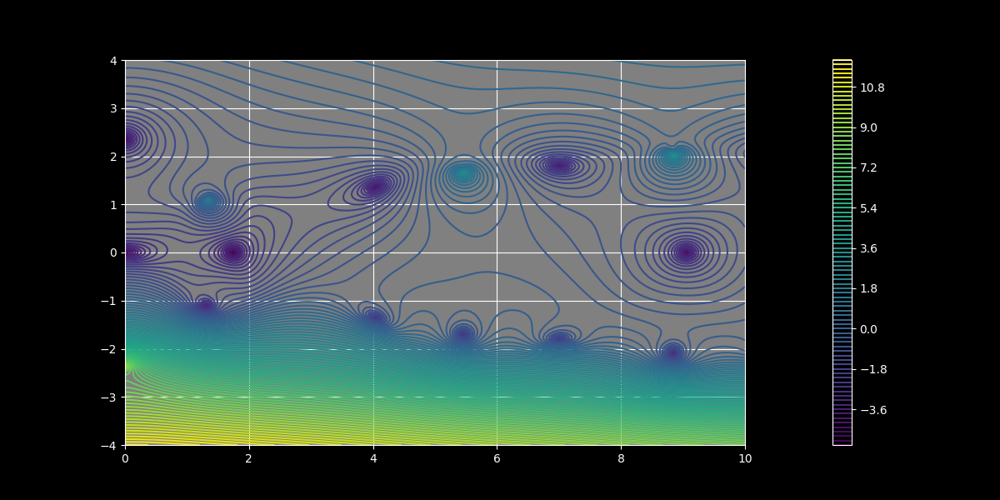

In [53]:
plotlogf(even_integrand_paper_0, 0, 10, -4, 4, iref=150, rref=150, levels=100)

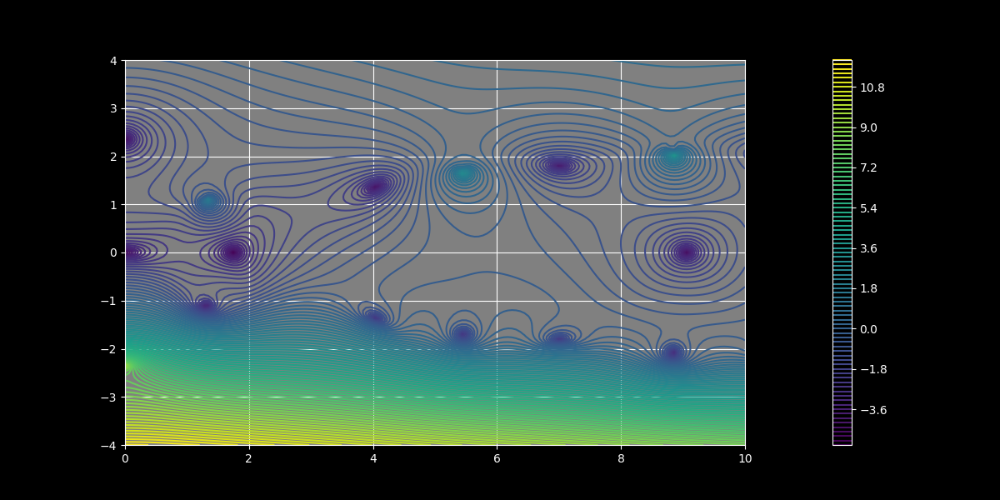

In [51]:
plotlogf(even_integrand_paper_1, 0, 10, -4, 4, iref=150, rref=150, levels=100)

## Our method

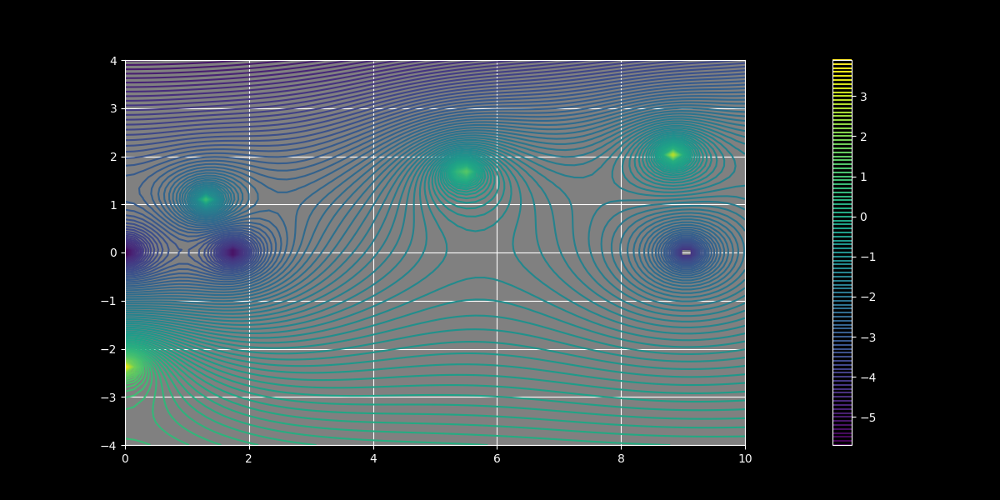

In [41]:
plotlogf(even_integrand_ours_0, 0, 10, -4, 4, iref=70, rref=70, levels=100, loop=True)

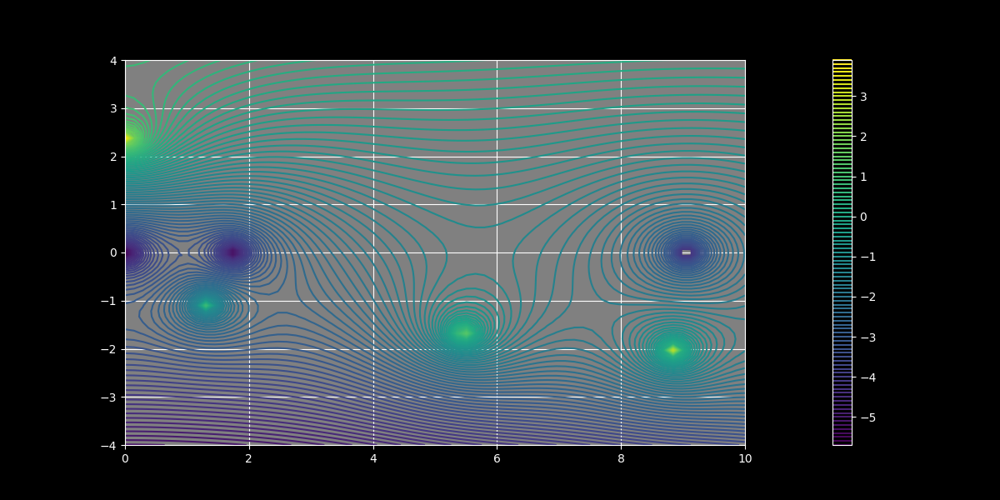

In [63]:
plotlogf(even_integrand_ours_1, 0, 10, -4, 4, iref=70, rref=70, levels=100, loop=True)

In [64]:
plt.plot(Z.real, Z.imag, 'ro');

### Three dimensional pole picture

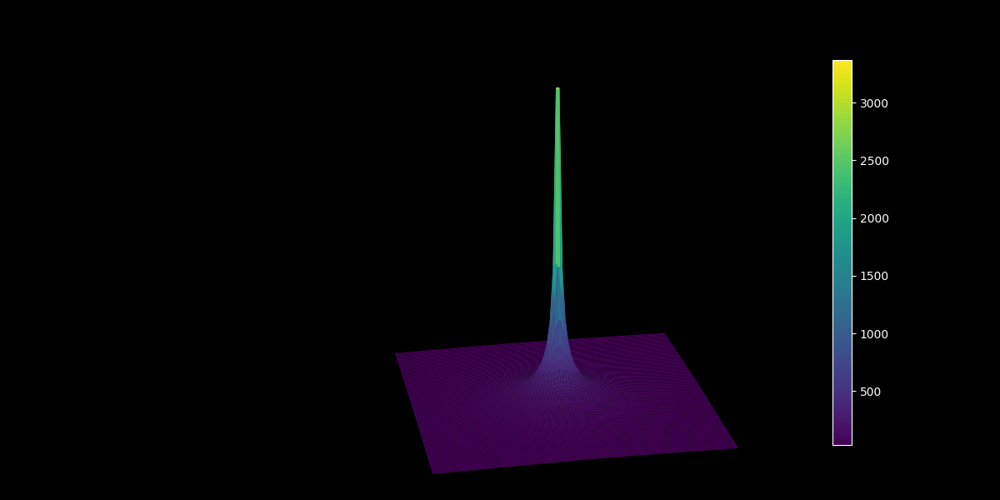

In [69]:
plotlogf(even_integrand_ours_1, Z.real-.001, Z.real+.001, Z.imag-.001, Z.imag+.001,
        iref=100, rref=100, log_off=True, three_D=True, cstride=1, rstride=1, loop=True,
        elev=20, azim=-101)

Definitely looking pole like